# Advanced Lane Finding - 12/17/2017

In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
%matplotlib inline
import glob

## Calibrate camera using chessboard pictures
The calibration camera matrix and distortion coefficients are calculated through a cheeseboard picture taken by the camera. The corners on the chessboard are detected, and then the distorted images are then undistorted by putting the corners onto the same plane.

In [2]:
#reading in calbration image
calimages = glob.glob('camera_cal/*.jpg')

objpoints = [] #3D points in real world space
imgpoints = [] #2D points in image plane
nx = 9
ny = 6
#prepare object points
objp = np.zeros((ny*nx,3),np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2) #generate x and y coordinates

#loop over each calibration images
for fname in calimages:
    #read in each image
    img = mpimg.imread(fname)
    #convert to gray
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    #detect corners of chessboard
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

    #if corners are found, add object points and image points
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)
    
    #draw and display corners
    #img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
    #plt.imshow(img)
    
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

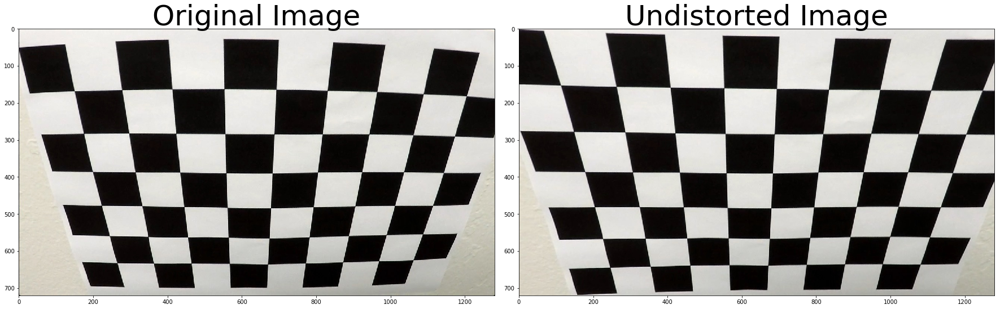

In [3]:
#check distortion parameters
img = mpimg.imread('camera_cal/calibration2.jpg')
undst = cv2.undistort(img, mtx, dist, None, mtx)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undst)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Line detection using HLS, Color and Gradient
I have tried to use HLS and RGB thresholds, as well as gray/color x gradient to detect lines. I have fine-tuned the thresholds to better pick up the lanes and to minimize the noises.

- For HLS threshold, S does a good job in detecting both yellow and white lines, however, when there are shadows, S tends to pick up noises. L threshold picks up white lines very well, but is totally blind to yellow lines. H is not helpful in detecting lines.

- For RGB thresholds, R performs better than B and G, and is able to pick up both yellow and white lines.

- I have also used LAB threhold. The B channel picks up yellow lines very accurately, but completely ignores white lanes.

- I have also applied x direction gradient thresholds on both RGB channels and gray images. B and gray gradient are performing better than R and G gradient, however, the direction gradient picks up a lot of other noises, so I did not end up using them.


In [4]:
# function to apply thresholds
def find_lines(img, plot):

    ### HLS threshold
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    # S-Threshold color channel
    s_channel = hls[:,:,2]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= 180) & (s_channel <= 255)] = 1    
    # L-Threshold color channel
    l_channel = hls[:,:,1]
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= 210) & (l_channel <= 255)] = 1
    # H-Threshold color channel
    h_channel = hls[:,:,0]
    h_binary = np.zeros_like(h_channel)
    h_binary[(h_channel >= 180) & (h_channel <= 255)] = 1

    ### directional gradient
    # Grayscale gradient
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    abs_sobelx = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0)) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))   
    s_xbinary = np.zeros_like(scaled_sobel)# Threshold x gradient
    s_xbinary[(scaled_sobel >= 20) & (scaled_sobel <= 100)] = 1

    ### Color gradient
    R = img[:,:,0]
    G = img[:,:,1]
    B = img[:,:,2]
    # Color-R gradient
    abs_sobelx = np.absolute(cv2.Sobel(R, cv2.CV_64F, 1, 0)) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx)) 
    r_xbinary = np.zeros_like(scaled_sobel) # Threshold x gradient
    r_xbinary[(scaled_sobel >= 20) & (scaled_sobel <= 100)] = 1
    # Color-G gradient
    abs_sobelx = np.absolute(cv2.Sobel(G, cv2.CV_64F, 1, 0)) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx)) 
    g_xbinary = np.zeros_like(scaled_sobel) # Threshold x gradient
    g_xbinary[(scaled_sobel >= 20) & (scaled_sobel <= 100)] = 1
    # Color-B gradient  
    abs_sobelx = np.absolute(cv2.Sobel(B, cv2.CV_64F, 1, 0)) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx)) 
    b_xbinary = np.zeros_like(scaled_sobel) # Threshold x gradient
    b_xbinary[(scaled_sobel >= 20) & (scaled_sobel <= 80)] = 1
            
    ### color threshold
    # R threshold
    r_binary = np.zeros_like(R)
    r_binary[(R > 222) & (R <= 255)] = 1
    # G threshold
    g_binary = np.zeros_like(G)
    g_binary[(G > 200) & (G <= 255)] = 1
    # B threshold
    b_binary = np.zeros_like(B)
    b_binary[(B > 160) & (B <= 200)] = 1
    
    ### Lab B threshold
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    lab_b = lab[:,:,2]
    lab_b_binary = np.zeros_like(lab_b)
    lab_b_binary[(lab_b > 150) & (lab_b <= 200)] = 1
    
    # Stack each channel to view their individual contributions
    color_binary = np.dstack((s_xbinary, s_binary, r_binary)) * 255

    # Combine the selected binary thresholds
    binary_warped = np.zeros_like(s_xbinary)
    binary_warped[(r_binary==1)| (l_binary==1)| (lab_b_binary==1)] = 1
    # Plotting thresholded images
    if (plot == 1):
        f, ((ax1, ax2, ax3),(ax4, ax5, ax6)) = plt.subplots(2, 3, figsize=(20,10))
        f.tight_layout()
        ax1.set_title('initial image')
        ax1.imshow(img)
        ax2.set_title('Combined thresholds')
        ax2.imshow(binary_warped, cmap='gray')
        ax3.set_title('Satuation threholds')
        ax3.imshow(s_binary, cmap='gray')
        ax4.set_title('R threholds')
        ax4.imshow(r_binary, cmap='gray')
        ax5.set_title('Light threshold')
        ax5.imshow(l_binary, cmap='gray')  
        ax6.set_title('Lab B gradient')
        ax6.imshow(lab_b_binary, cmap='gray')
    return binary_warped

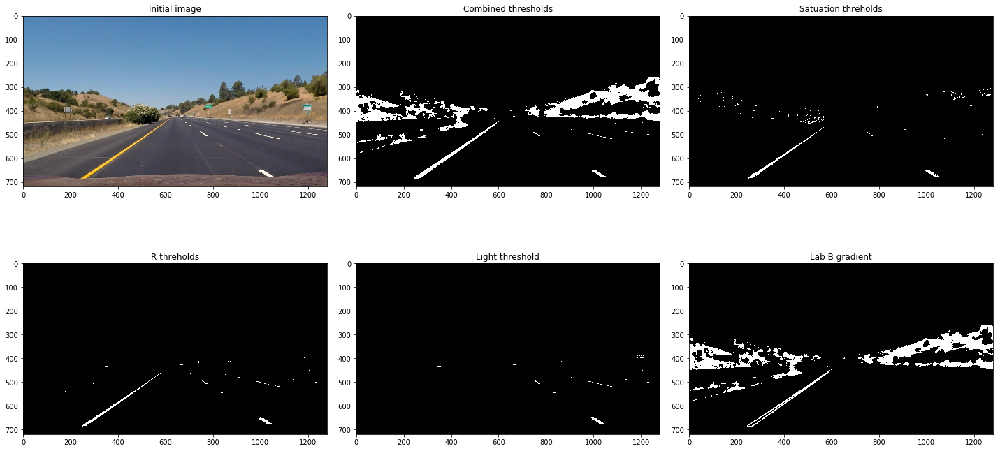

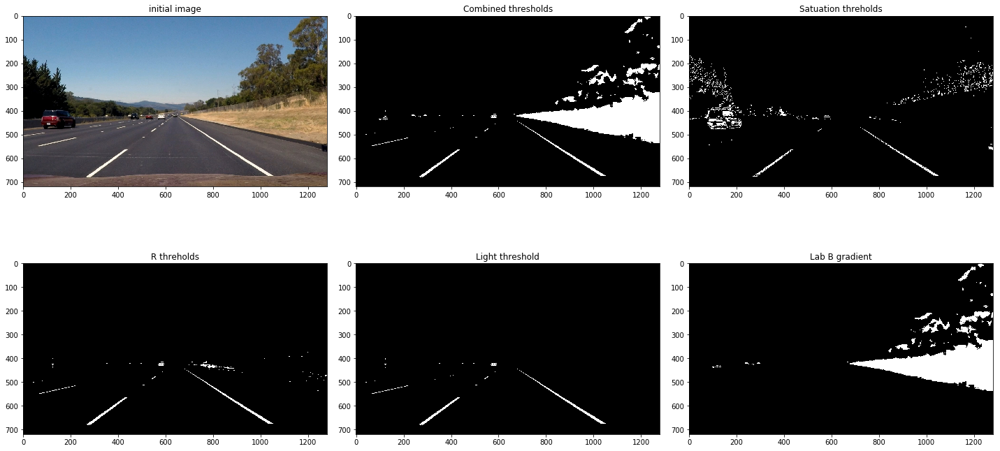

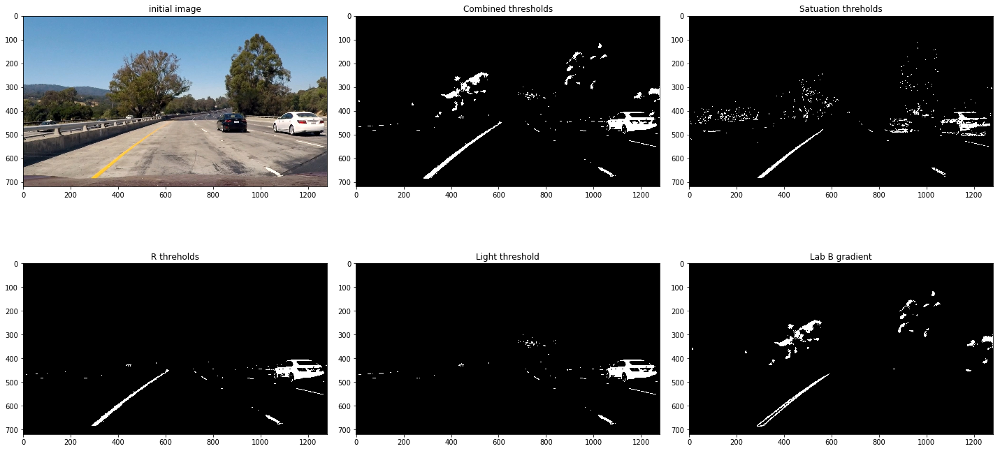

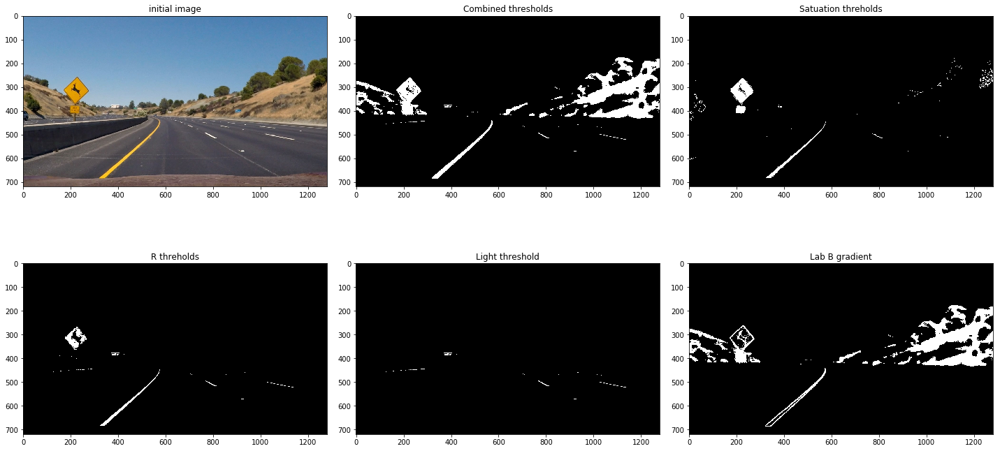

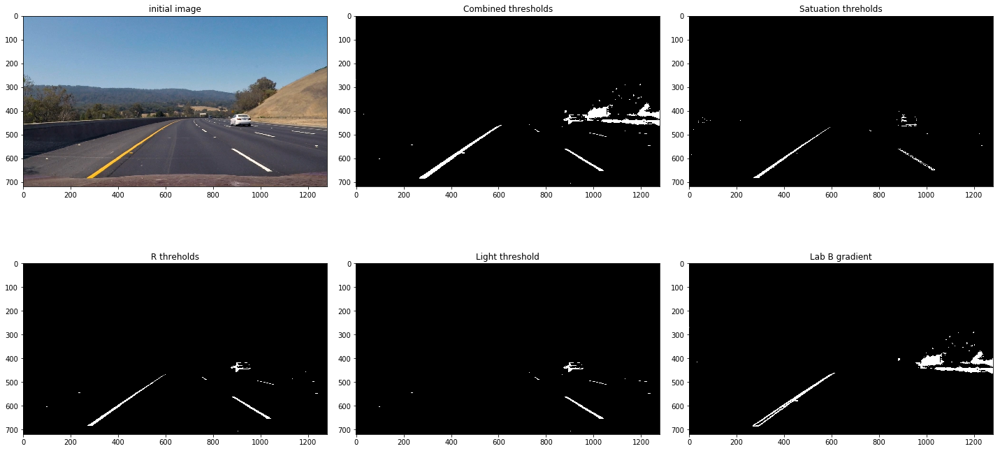

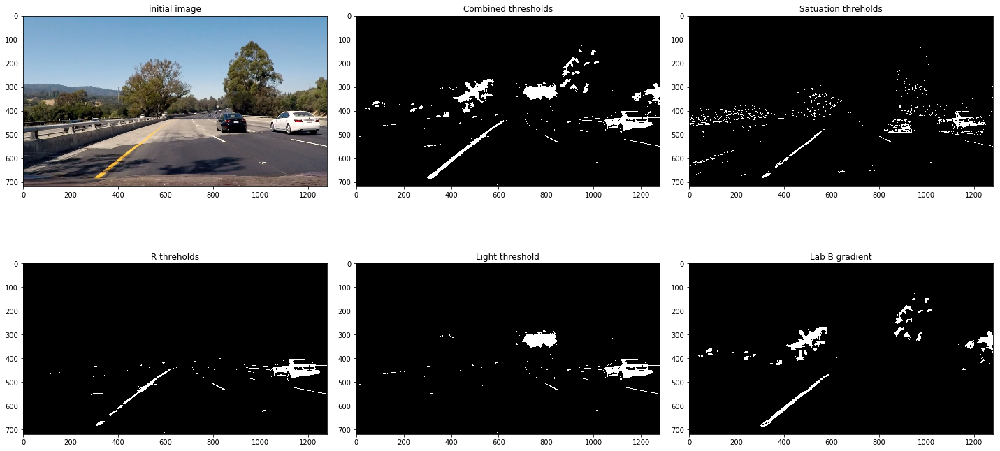

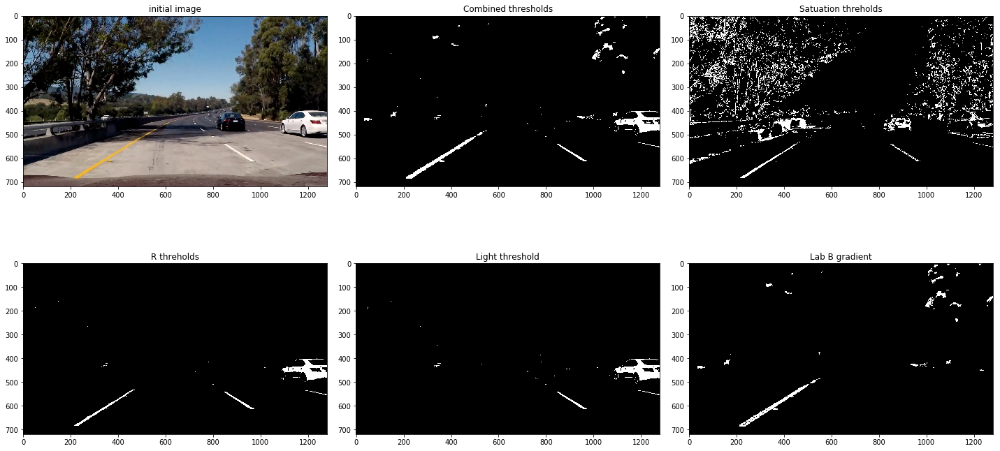

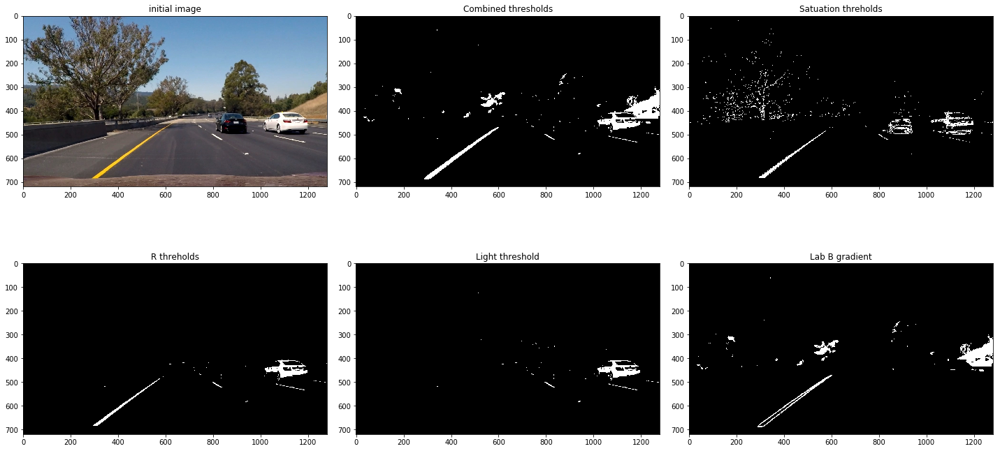

In [5]:
testimages = glob.glob('test_images/*.jpg') #glob.glob('camera_cal/calibration*.jpg')#
#loop over each calibration images
for fname in testimages:
    #read in each image
    img = mpimg.imread(fname)
    img_size = (img.shape[1], img.shape[0])
    undst = cv2.undistort(img, mtx, dist, None, mtx)
    
    binary_warped = find_lines(img,1)

## Perspective Transform
I have performed perspective transform to convert the 3D image into 2D image to provide a bird's eye view of the lanes. The transform coordinates are determined by trial and error, so that the straight lanes in the test images are transformed into parallel lines.

In the beginning, I have only selected the bottom part of the curves. That part of the lines tend to be more straight, and thus I lose the curvature information. In order to better capture the curvature, I have included the curves higher up.

In [201]:
def perspectiveTF(img, img_size):
    src = np.float32([[566/1280*img_size[0], 455/720*img_size[1]],
                        [717/1280*img_size[0], 455/720*img_size[1]],
                        [1280/1280*img_size[0], 720/720*img_size[1]],
                        [0/1280*img_size[0], 720/720*img_size[1]]])
    dst = np.float32([[300/1280*img_size[0], 0/720*img_size[1]],
                        [980/1280*img_size[0], 0/720*img_size[1]],
                        [980/1280*img_size[0], 720/720*img_size[1]],
                        [300/1280*img_size[0], 720/720*img_size[1]]])
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return (warped, Minv)

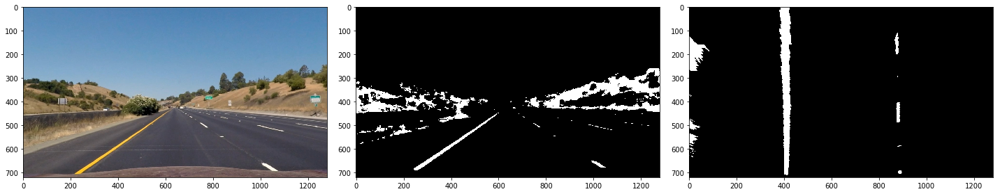

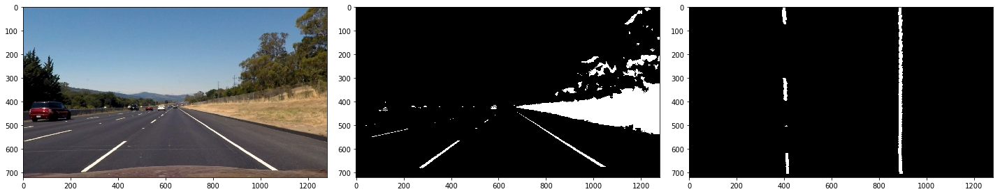

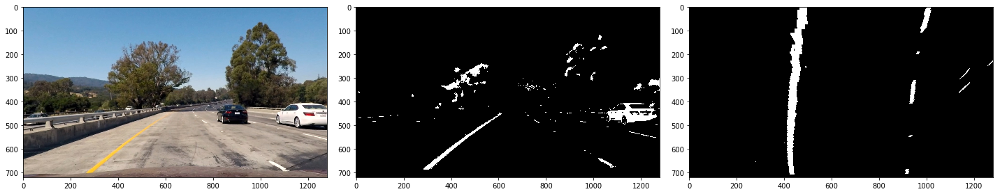

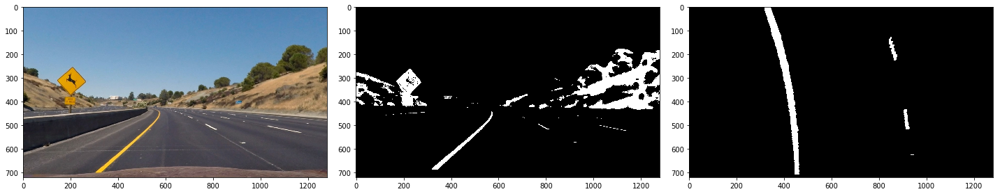

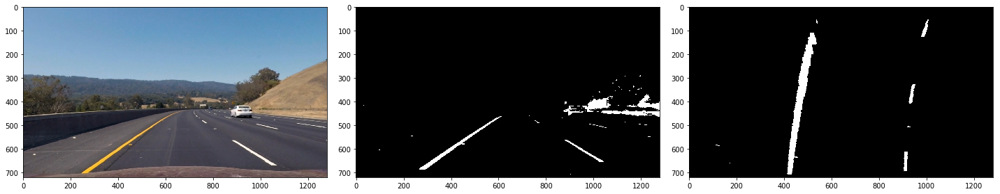

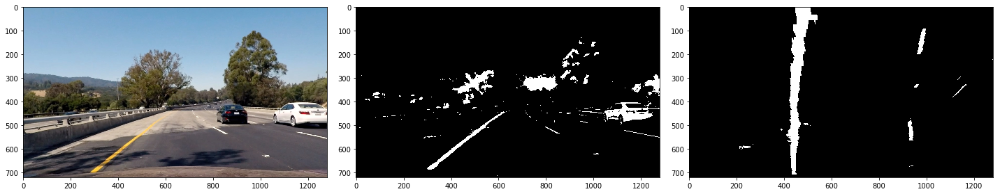

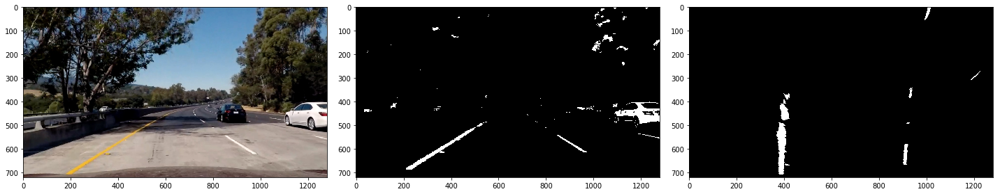

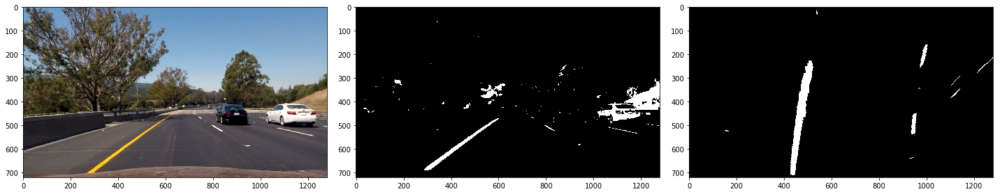

In [202]:
#reading in test image
testimages = glob.glob('test_images/*.jpg') #glob.glob('camera_cal/calibration*.jpg')#
#loop over each calibration images
for fname in testimages:
    f, ((ax1, ax2, ax3)) = plt.subplots(1,3, figsize=(20,10))
    f.tight_layout()
    
    #read in each image
    img = mpimg.imread(fname)
    img_size = (img.shape[1], img.shape[0])
    
    #step 1- undistort images
    undst = cv2.undistort(img, mtx, dist, None, mtx)
    #step 2- detect lines
    binary_warped = find_lines(img,0)
    #step 3- perspective transform
    (warped, Minv) = perspectiveTF(binary_warped, img_size)
    
    ax1.imshow(undst)  
    ax2.imshow(binary_warped, cmap='gray')
    ax3.imshow(warped, cmap='gray')

## Lane Detection
I have implemented a sliding window methods to detect lines from the image. This method uses a histogram of detected pixels to locate the base of the lanes. From there, sliding windows are constructed towards the intercept point to detect the remaining relevant pixels. A polynomial function is then fitted seperately to the detected points for the left and right lanes.

If there are saved lines detected in the previous frame, I started the line search from the previously fitted lines in order to save searching time.

In [203]:
def lane_detection(warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(warped[int(warped.shape[0]/2):,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((warped, warped, warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = warped.shape[0] - (window+1)*window_height
        win_y_high = warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    return (out_img,left_fit,right_fit)

In [204]:
def lane_detection_from_previous_fit(warped, l_best_fit, r_best_fit):
    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    # Create an output image to draw on and  visualize the result
    out_img0 = np.dstack((warped, warped, warped))*255
    window_img = np.zeros_like(out_img0)
    
    nonzero = warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    
    left_lane_inds = ((nonzerox > (l_best_fit[0]*(nonzeroy**2) + l_best_fit[1]*nonzeroy + 
    l_best_fit[2] - margin)) & (nonzerox < (l_best_fit[0]*(nonzeroy**2) + 
    l_best_fit[1]*nonzeroy + l_best_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (r_best_fit[0]*(nonzeroy**2) + r_best_fit[1]*nonzeroy + 
    r_best_fit[2] - margin)) & (nonzerox < (r_best_fit[0]*(nonzeroy**2) + 
    r_best_fit[1]*nonzeroy + r_best_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
  

    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))
    
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    
    out_img = cv2.addWeighted(out_img0, 1, window_img, 0.3, 0)
    
    return (out_img,left_fit,right_fit)

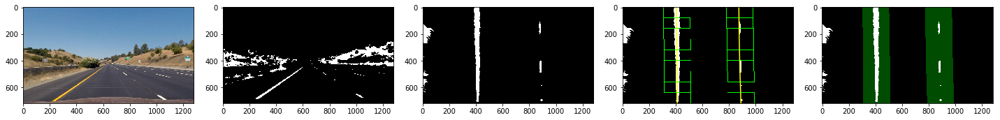

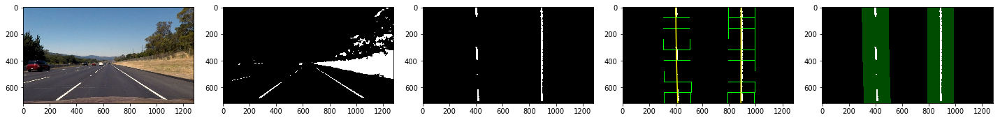

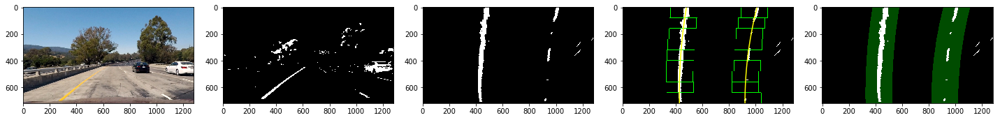

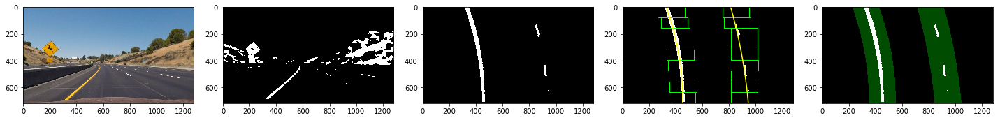

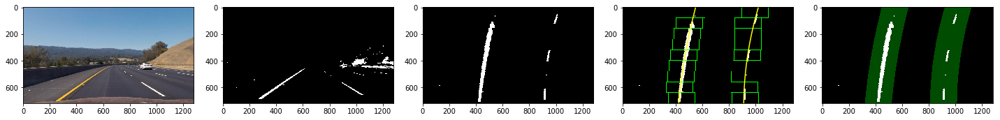

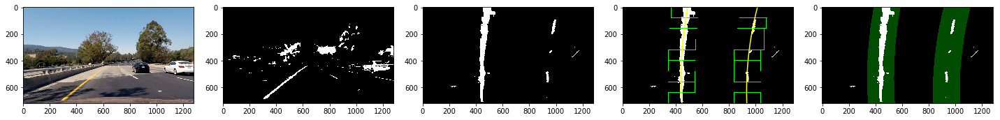

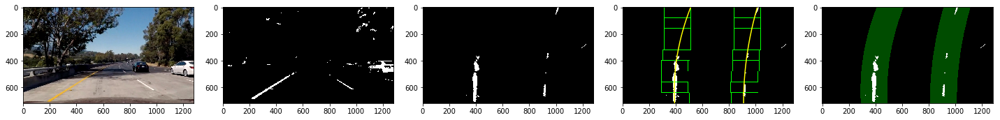

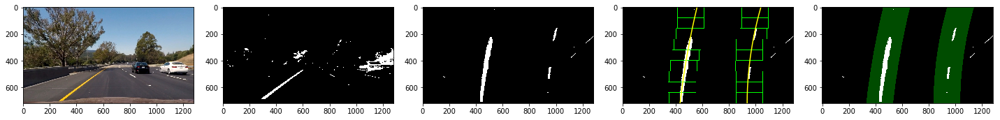

In [205]:
#reading in test image
testimages = glob.glob('test_images/*.jpg') #glob.glob('camera_cal/calibration*.jpg')#
#loop over each calibration images
for fname in testimages:
    f, ((ax1, ax2, ax3, ax4, ax5)) = plt.subplots(1,5, figsize=(20,10))
    f.tight_layout()
    
    #read in each image
    img = mpimg.imread(fname)
    img_size = (img.shape[1], img.shape[0])
    
    #step 1- undistort images
    undst = cv2.undistort(img, mtx, dist, None, mtx)
    #step 2- detect lines
    binary_warped = find_lines(img,0)
    #step 3- perspective transform
    (warped, Minv) = perspectiveTF(binary_warped, img_size)
    #step 4- detect lanes
    (out_img1,left_fit,right_fit)= lane_detection(warped)

    (out_img2,left_fit,right_fit)= lane_detection_from_previous_fit(warped, left_fit, right_fit)
    
    ax1.imshow(undst)  
    ax2.imshow(binary_warped, cmap='gray')
    ax3.imshow(warped, cmap='gray')  
    ax4.imshow(out_img1, cmap='gray')
    
    # Generate x and y values for plotting the fitted lines
    ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    ax4.plot(left_fitx, ploty, color='yellow')
    ax4.plot(right_fitx, ploty, color='yellow')
    
    ax5.imshow(out_img2, cmap='gray')   

## Draw Polygon and calculate curvatures
I drew a polygon in the area between two detected lanes, and calculated the curvature of the lanes and distance from lane center.

To calculate the curvature, I used the radius of curvature formula from here: https://www.intmath.com/applications-differentiation/8-radius-curvature.php. The formula uses the first and second derivatives of the polynomial to calculate the radius. The coordinates are converted to meters to fit the polynomials in the real world space.

To find out the distance of the car from the lane center, I first calculated the center of the fitted left and right lanes as the midpoint of the bottom points. Then I located the center of the image. The difference between the two is the offset from the center. 



In [217]:
def draw_poly(warped, undst, left_fit,right_fit,img_size):
    # Generate x and y values for plotting
    ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # calculate curvature in meters
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    # Define y-value where we want radius of curvature
    # choose the maximum y-value, corresponding to the bottom of the image to calculate the new radii of curvature
    y_eval = np.max(ploty)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    car_center = (left_fitx[-1]+right_fitx[-1])/2
    lane_center = warped.shape[1]/2
    offset = (lane_center-car_center)*xm_per_pix
    #print((left_curverad+right_curverad)/2, 'm ', left_curverad, 'm', right_curverad, 'm',offset)   
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, img_size) 
    # Combine the result with the original image
    result = cv2.addWeighted(undst, 1, newwarp, 0.3, 0)
#     plt.imshow(result)

    return (result, left_curverad, right_curverad, offset)

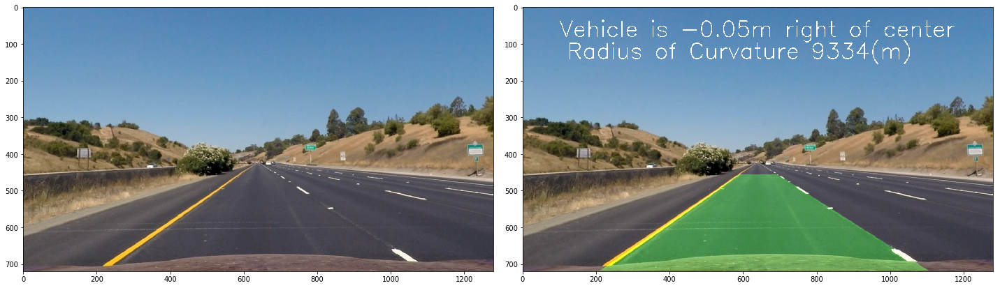

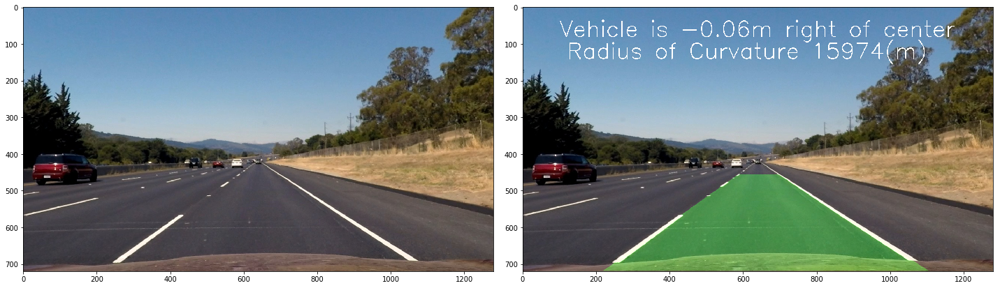

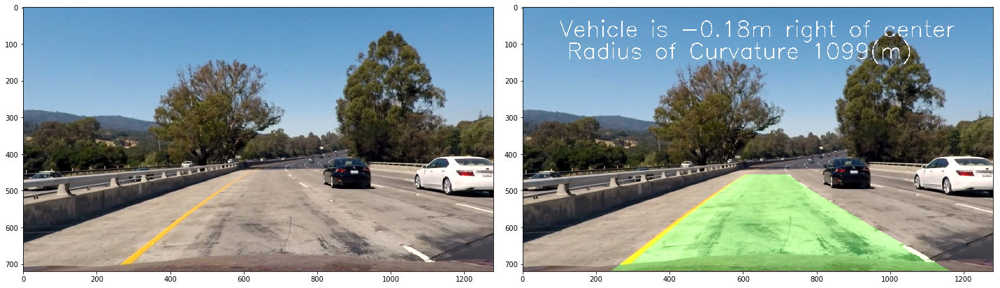

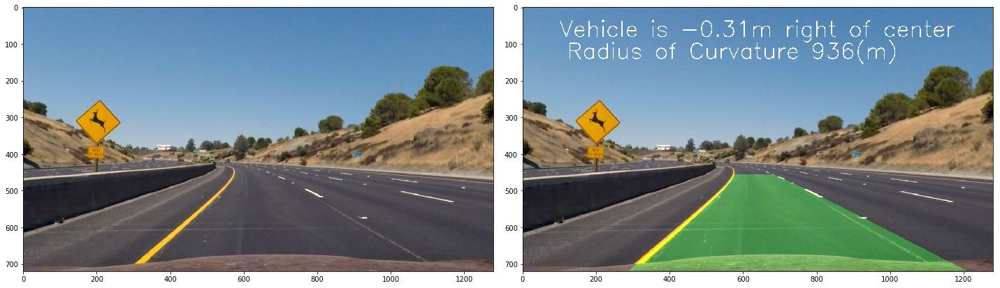

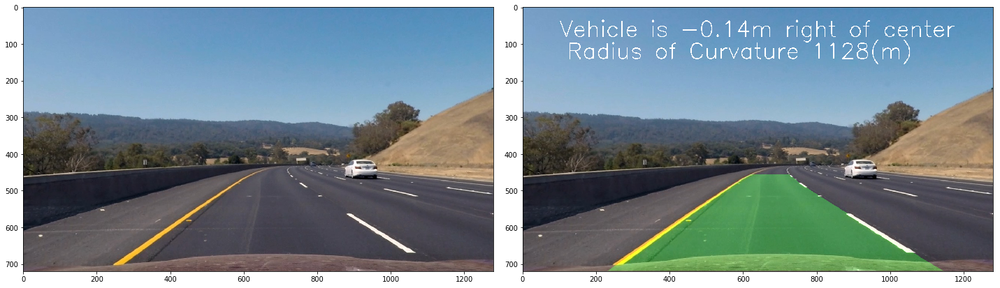

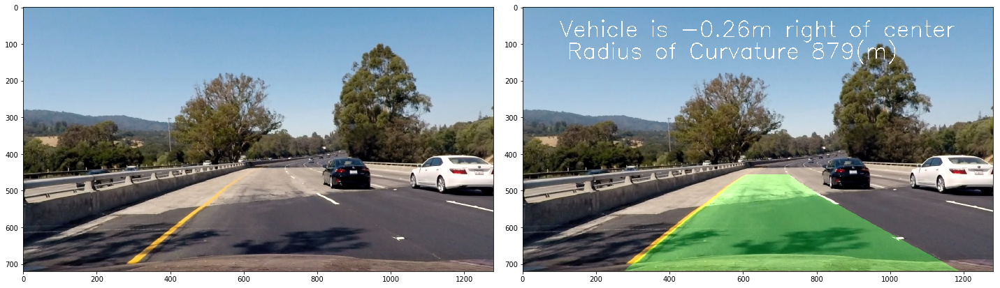

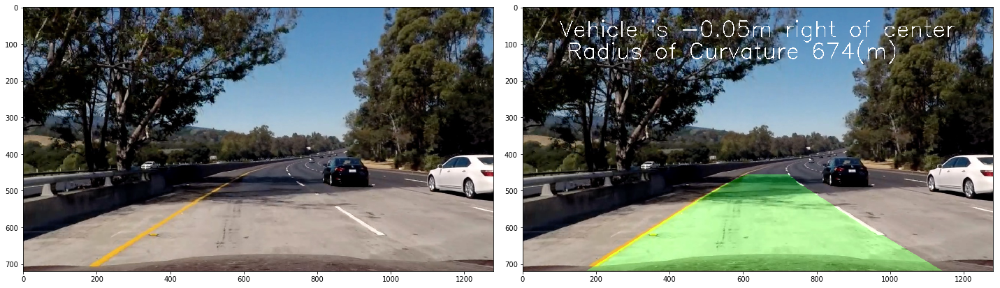

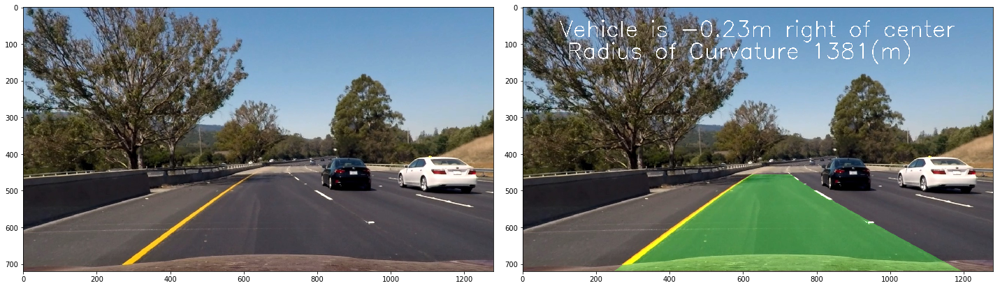

In [218]:
# correct for distortion
#reading in test image
testimages = glob.glob('test_images/*.jpg') #glob.glob('camera_cal/calibration*.jpg')#
#loop over each calibration images
for fname in testimages:
    f, ((ax1, ax2)) = plt.subplots(1,2, figsize=(20,10))
    f.tight_layout()
    
    #read in each image
    img = mpimg.imread(fname)
    img_size = (img.shape[1], img.shape[0])
    
    #step 1- undistort images
    undst = cv2.undistort(img, mtx, dist, None, mtx)
    #step 2- detect lines
    binary_warped = find_lines(img,0)
    #step 3- perspective transform
    (warped, Minv) = perspectiveTF(binary_warped, img_size)
    #step 4- detect lanes
    (out_img,left_fit,right_fit)= lane_detection(warped)
    #step 5- draw polygons
    (img_poly, left_curverad, right_curverad, offset) = draw_poly(warped,undst, left_fit,right_fit, img_size)
    #step 6- add text
    # Print radius of curvature on video
    cv2.putText(img_poly, 'Radius of Curvature {}(m)'.format(int((left_curverad+right_curverad)/2)), (120,140),
             fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 2)
    cv2.putText(img_poly, 'Vehicle is {:.2f}m right of center'.format(offset), (100,80),
                 fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 2)
    ax1.imshow(undst)
    ax2.imshow(img_poly)
    

## Create a class for lane lines
I have created a class called Line in order to record fitted lines in the previous frame. There are several reasons for using a class:
- In case of a bad frame where the model is not able to detect lines properly, we can still pick up the fits from the previous frames.
- to smooth out the fit across different frames by averaging the past fit parameters
- if there are saved fits from the previous frames, start the line search from the previous fitted lines, instead of searching from scratch using sliding window 
  

In [219]:
from operator import mul
class Line(object):
    frame_number = 0
    def process_frame(self, frame):
        self.frame_number += 1
    def __init__(self):   
        self.current_fit = [] #polynomial coefficients for the most recent fit       
        self.detected = False # was the line detected in the last iteration?        
        self.best_fit = None 
        self.diffs = np.array([0,0,0], dtype='float') #difference in fit coefficients between last and new fits
    def add_fit(self, fitx):
        if fitx is not None:
            if self.best_fit is not None: # if we have a best fit, see how this new fit compares               
                self.diffs = abs(fitx-self.best_fit)
            if (self.diffs[0]>0.001 or self.diffs[1]>1.0 or self.diffs[2]>100.) and len(self.current_fit)>0:# bad fit, discard unless there is no current_fit               
                self.detected = False
            else:
                self.detected = True
                self.current_fit.append(fitx)
                if len(self.current_fit) > 3:# throw out old fits, keep newest n
                    self.current_fit = self.current_fit[len(self.current_fit)-3:]
                self.best_fit = np.average(self.current_fit, axis=0)
        else: # or remove one from the history, if not found
            self.detected = False
            if len(self.current_fit) > 0:# throw out oldest fit              
                self.current_fit = self.current_fit[:len(self.current_fit)-1]
            if len(self.current_fit) > 0:             
                self.best_fit = np.average(self.current_fit, axis=0)# if still fits saved, best_fit is their average
        self.frame_number += 1


## Create pipeline function 
In this step, I created a pipeline function to run through all the steps described above. The output image has a polygon highlighted in between the two lanes. 

I ran the pipeline function through the test images. Since these test images are randomly selected at random intervals from the original video, they are not adjacent frames. The images below show how the smoothing function works, whereby it averages the previous frame's fitted curvatures with the current frame, hence the misfit and incorrect curvatures shown. Once we apply this smoothing function to our full video, we observe the merits of the averaging scheme, where the image frames are continuous. 

In [220]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML
def process_pipeline(img):
    img_size = (img.shape[1], img.shape[0])
    
    #step 1- undistort images
    undst = cv2.undistort(img, mtx, dist, None, mtx)
    #step 2- detect lines
    binary_warped = find_lines(img,0)
    #step 3- perspective transform
    (warped, Minv) = perspectiveTF(binary_warped, img_size)
    #step 4- detect lanes
#     (out_image,left_fit,right_fit)= lane_detection(warped)
    if not l_line.detected or not r_line.detected:
        (out_image,left_fit,right_fit)= lane_detection(warped)
    else:
        (out_image,left_fit,right_fit)= lane_detection_from_previous_fit(warped, l_line.best_fit, r_line.best_fit)

    l_line.add_fit(left_fit)
    r_line.add_fit(right_fit)
    
    #step 5- draw polygons
    (img_poly, left_curverad, right_curverad, offset) = draw_poly(warped,undst, l_line.best_fit,r_line.best_fit, img_size)
    #img_poly = draw_poly(warped,undst, ploty, left_fit, right_fit, img_size)
    #step 6- add text
    # Print radius of curvature on video
    cv2.putText(img_poly, 'Radius of Curvature {}(m)'.format(int((left_curverad+right_curverad)/2)), (120,140),
             fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 2)
    cv2.putText(img_poly, 'Vehicle is {:.2f}m right of center'.format(offset), (100,80),
                 fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 2)

    return img_poly 

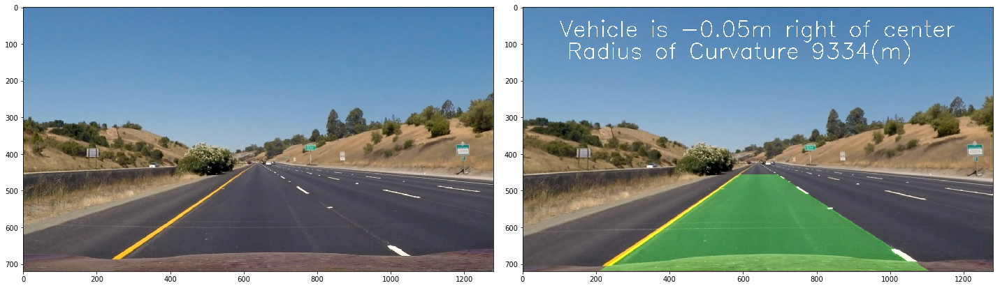

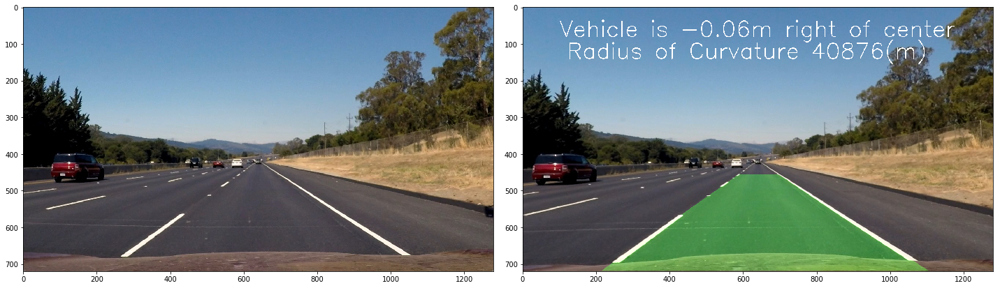

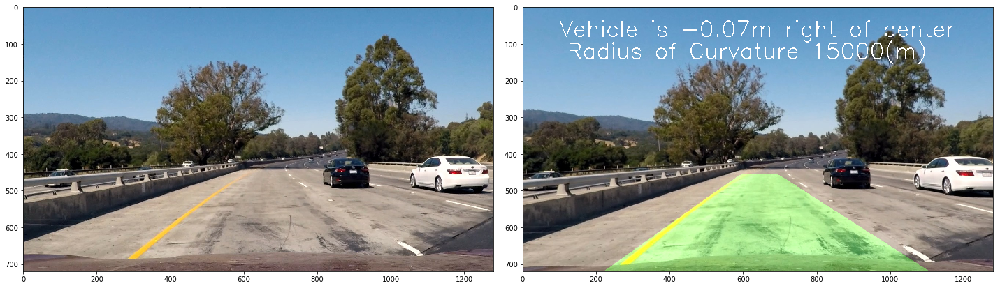

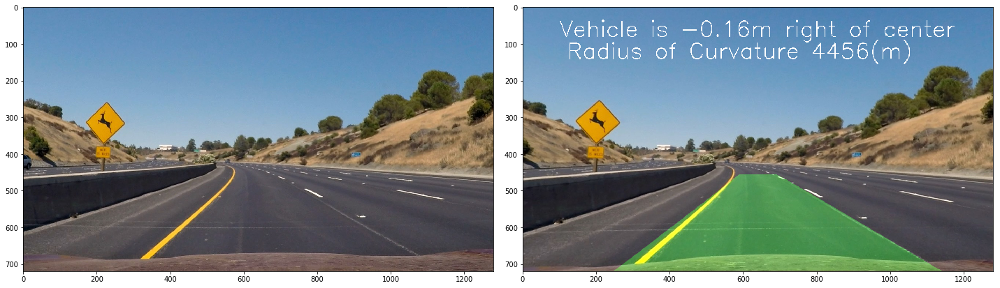

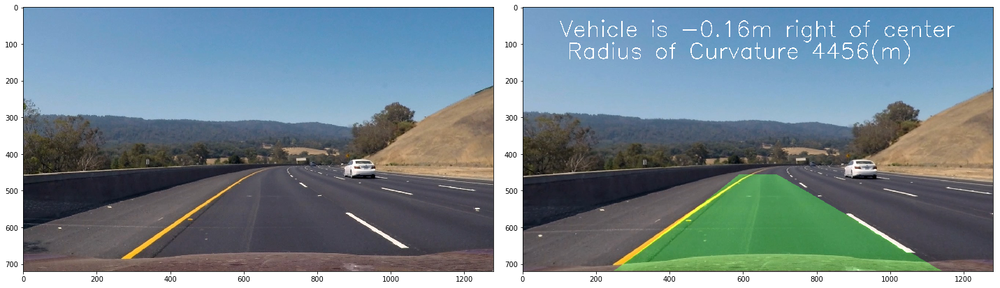

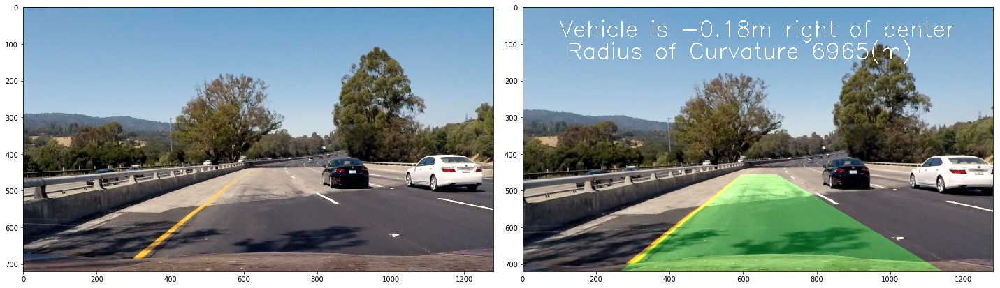

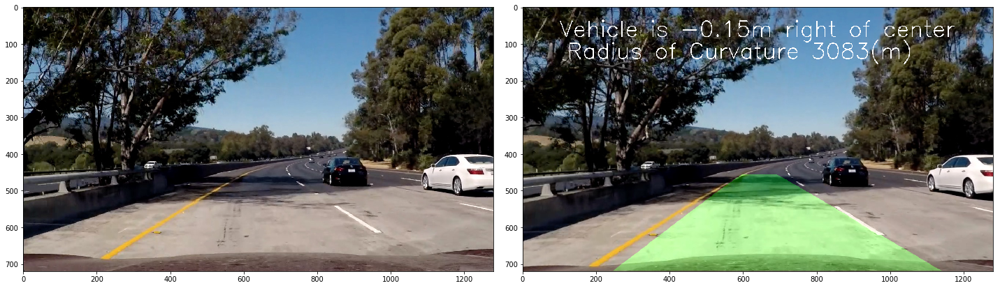

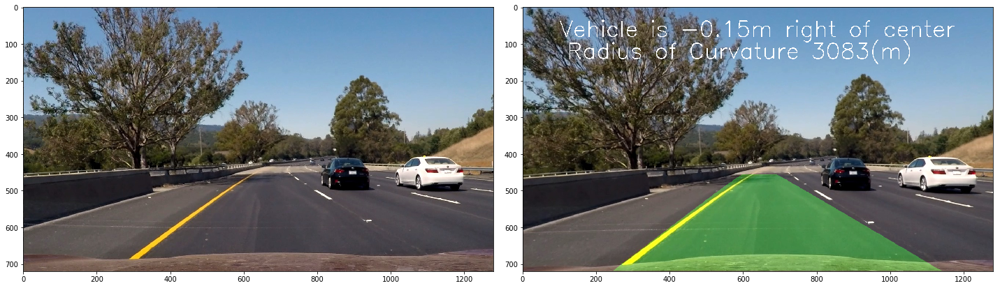

In [221]:
l_line = Line()
r_line = Line()
# correct for distortion
#reading in test image
testimages = glob.glob('test_images/*.jpg') #glob.glob('camera_cal/calibration*.jpg')#
#loop over each calibration images
for fname in testimages:
    f, (ax1, ax2) = plt.subplots(1,2, figsize=(20,10))
    f.tight_layout()
    
    #read in each image
    img = mpimg.imread(fname)
    img_poly=process_pipeline(img)
     
    ax1.imshow(img)
    ax2.imshow(img_poly)

## Run pipeline on video

In [222]:
l_line = Line()
r_line = Line()
clip1 = VideoFileClip("project_video.mp4")#.subclip(0,5)#("harder_challenge_video.mp4")
white_clip = clip1.fl_image(process_pipeline) 
video_output = 'result.mp4'
white_clip.write_videofile(video_output, audio=False, verbose= True, progress_bar=True)

[MoviePy] >>>> Building video result.mp4
[MoviePy] Writing video result.mp4


100%|█████████▉| 1260/1261 [06:11<00:00,  4.17it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: result.mp4 



In [223]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output))

## Improvements
- try to improve the line finding process. Now the curvatures tend to oscilate when there are shadows. 
- automated ways of defining the coordinates for perspective transform. The final curvature results are quite sensitive to how I define the transform coordinates. If I choose coordinates lower towards the bottom, only the lower part of the lanes are studied, which tends to be straight and the curvatures are higher. If I choose the coordinates upper towards the intercept, the shape of the lanes will be better captured and the curvatures are tend to be smaller. 
- check if the two detected lanes are more or less parallel. Ideally, the two fitted lines should be parallel to each other. Again it is pretty sensitive to the perspective transform.
- find ways to produce more stablized curvatures.